In [52]:
#CRIME DYNAMIC ANALYSIS

#importing the required files
import pandas as pd
df = pd.read_csv("/content/Crime_Data_from_2020_to_Present (1).csv")
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784.0,1.0,510.0,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182.0,1.0,330.0,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356.0,1.0,480.0,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964.0,1.0,343.0,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,200412582,09/09/2020 12:00:00 AM,09/09/2020 12:00:00 AM,630,4,Hollenbeck,413.0,1.0,510.0,VEHICLE - STOLEN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,200 E AVENUE 28,NaN,34.0820,-118.2130


In [53]:
df.shape

(512227, 28)

In [54]:
df.columns

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'Crm Cd 1',
       'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'LOCATION', 'Cross Street', 'LAT',
       'LON'],
      dtype='object')

In [55]:
# Check missing values
df.isnull().sum()

,0
DR_NO,0
Date Rptd,0
DATE OCC,0
TIME OCC,0
AREA,0
AREA NAME,0
Rpt Dist No,1
Part 1-2,1
Crm Cd,1
Crm Cd Desc,1


In [56]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df.columns

Index(['dr_no', 'date_rptd', 'date_occ', 'time_occ', 'area', 'area_name',
       'rpt_dist_no', 'part_1-2', 'crm_cd', 'crm_cd_desc', 'mocodes',
       'vict_age', 'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'location', 'cross_street', 'lat',
       'lon'],
      dtype='object')

In [57]:
categorical_cols = ['vict_sex', 'vict_descent', 'premis_desc', 'status']
for col in categorical_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)


<ipython-input-57-e806b8e16653>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)


In [58]:
df['weapon_used_cd'].fillna('Unknown', inplace=True)
df['weapon_desc'].fillna('Unknown', inplace=True)

<ipython-input-58-d65eeb8dd9e0>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['weapon_used_cd'].fillna('Unknown', inplace=True)
<ipython-input-58-d65eeb8dd9e0>:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Unknown' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df['weapon_used_cd'].fillna('Unknown', inplace=True)
<ipython-input-58-d65eeb8dd9e0>:2: FutureWarning: A value is trying to be set on 

In [59]:
# Fill missing lat and lon with the average of the existing values
df['lat'].fillna(df['lat'].mean(), inplace=True)
df['lon'].fillna(df['lon'].mean(), inplace=True)

<ipython-input-59-87f383c4d5c0>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lat'].fillna(df['lat'].mean(), inplace=True)
<ipython-input-59-87f383c4d5c0>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usin

In [60]:
df.drop(columns=['crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'cross_street', 'mocodes'], inplace=True)

In [61]:
df.isnull().sum()

,0
dr_no,0
date_rptd,0
date_occ,0
time_occ,0
area,0
area_name,0
rpt_dist_no,1
part_1-2,1
crm_cd,1
crm_cd_desc,1


In [62]:
df.columns

Index(['dr_no', 'date_rptd', 'date_occ', 'time_occ', 'area', 'area_name',
       'rpt_dist_no', 'part_1-2', 'crm_cd', 'crm_cd_desc', 'vict_age',
       'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'location', 'lat', 'lon'],
      dtype='object')

In [63]:
df.columns = df.columns.str.strip()
df.columns

Index(['dr_no', 'date_rptd', 'date_occ', 'time_occ', 'area', 'area_name',
       'rpt_dist_no', 'part_1-2', 'crm_cd', 'crm_cd_desc', 'vict_age',
       'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'location', 'lat', 'lon'],
      dtype='object')

**EDA**

In [64]:
import folium
import pandas as pd
import geopandas as gpd
from folium.plugins import HeatMap
import matplotlib.pyplot as plt


In [65]:
# Aggregate crime data by 'area_name' to get the count of crimes per area
crime_counts = df['area_name'].value_counts().reset_index()
crime_counts.columns = ['area_name', 'crime_count']

# Display the top 10 areas with the most crimes
top_areas = crime_counts.head(10)
print(top_areas)

     area_name  crime_count
0  77th Street        32825
1      Central        32513
2      Pacific        30260
3    Southwest        28395
4    Hollywood        27722
5    Southeast        26380
6  N Hollywood        25897
7      Olympic        25705
8       Newton        25068
9     Wilshire        23890


In [66]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Replace 'lat' and 'lon' column references as per your dataset, 'LAT' and 'LON' might be more accurate
df['lat'] = df['lat'].astype(float)
df['lon'] = df['lon'].astype(float)

# Create a base map centered around Los Angeles
m = folium.Map(location=[34.0522, -118.2437], zoom_start=12)

# Add a heatmap layer to visualize crime hotspots
heat_data = [[row['lat'], row['lon']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(m)

# Display the map
m


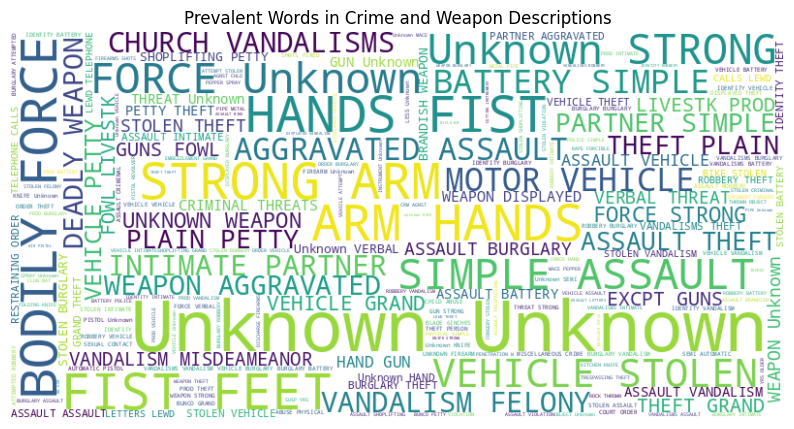

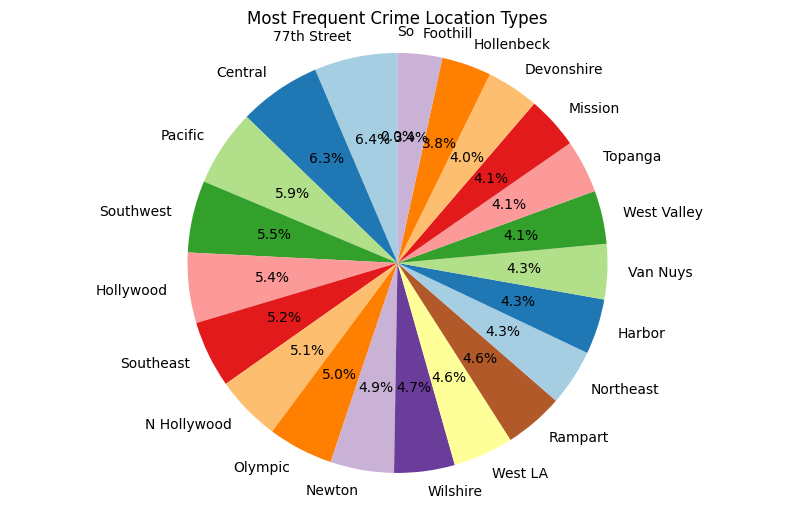

In [67]:
# Install necessary libraries
#!pip install wordcloud matplotlib

import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd

# Example data: Modify this to match your actual column names
# For the word cloud, using 'weapon_desc' and 'crm_cd_desc' as the text data
# Clean up any missing values before proceeding

# Word Cloud Visualization (Figure 3)
text_data = df['weapon_desc'].dropna().tolist() + df['crm_cd_desc'].dropna().tolist()  # Combine both columns

# Join all descriptions into a single string
text = ' '.join(text_data)

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Remove axis for better aesthetics
plt.title('Prevalent Words in Crime and Weapon Descriptions')
plt.show()

# Pie Chart Visualization (Figure 4)
# Assuming 'area_name' represents the location types of crimes
location_counts = df['area_name'].value_counts()

# Create a pie chart
plt.figure(figsize=(10, 6))
plt.pie(location_counts, labels=location_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Most Frequent Crime Location Types')
plt.axis('equal')  # Equal aspect ratio ensures pie chart is circular.
plt.show()


<ipython-input-68-e0c3b813bbd4>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_8_crimes.values, y=top_8_crimes.index, palette='Reds_r')  # 'Reds_r' for color gradient


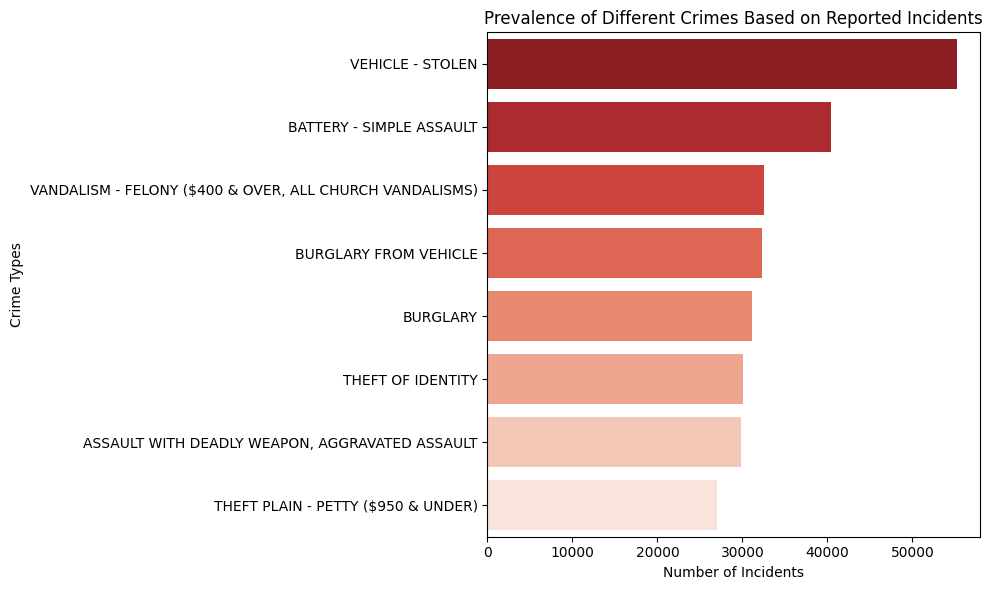

In [68]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Data preprocessing to get the top 8 crime types
# Assuming 'crm_cd_desc' contains the crime descriptions
crime_counts = df['crm_cd_desc'].value_counts()

# Get the top 8 most frequent crimes
top_8_crimes = crime_counts.head(8)

# Create a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=top_8_crimes.values, y=top_8_crimes.index, palette='Reds_r')  # 'Reds_r' for color gradient
plt.xlabel('Number of Incidents')
plt.ylabel('Crime Types')
plt.title('Prevalence of Different Crimes Based on Reported Incidents')
plt.tight_layout()  # Adjust layout to ensure everything fits
plt.show()


PERFORMING THE ANALYSIS OF DIFFERENT ALGORITHMS